In [1]:
import os
import numpy as np
import pandas as pd
import scanpy as sc
import anndata 
import seaborn as sns
from scipy.stats import zscore
from scipy import sparse 
import itertools

import matplotlib.pyplot as plt
import collections
from sklearn.cluster import KMeans
from sklearn import metrics

from sklearn.decomposition import PCA
from umap import UMAP

from py_pcha import PCHA

from matplotlib.colors import LinearSegmentedColormap

from scroutines.config_plots import *
from scroutines import powerplots # .config_plots import *
from scroutines import pnmf
from scroutines import basicu

In [2]:
def plot_pcs(res, npc, hue, palette=None):
    fig, axs = plt.subplots(npc-1,npc-1,figsize=(6*(npc-1),5*(npc-1)))
    for i, j in itertools.combinations(range(npc), 2):
        legend = False
        if (i,j) == (0,1): legend=True

        x, y = f"PC{j+1}", f"PC{i+1}"
        ax = axs[i,j-1]
        
        if palette is not None:
            sns.scatterplot(data=res.sample(frac=1, replace=False), 
                            x=x, y=y, 
                            hue=hue,
                            hue_order=list(palette.keys()),
                            palette=palette,
                            s=5, edgecolor='none', 
                            legend=legend,
                            ax=ax,
                           )
        else:
            sns.scatterplot(data=res.sample(frac=1, replace=False), 
                            x=x, y=y, 
                            hue=hue,
                            # hue_order=list(palette.keys()),
                            # palette=palette,
                            s=5, edgecolor='none', 
                            legend=legend,
                            ax=ax,
                           )
        sns.despine(ax=ax)
    axs[0,0].legend(bbox_to_anchor=(0.5, -0.2), loc='upper center')

    for i, j in itertools.product(range(npc-1), range(npc-1)):
        if j<i:
            ax = axs[i,j]
            ax.axis('off')

    plt.show()

In [3]:
outdir    = "/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/results"
outfigdir = "/u/home/f/f7xiesnm/project-zipursky/v1-bb/ms_reanalysis/"

In [4]:
adata_raw = anndata.read("../../data/cheng21_cell_scrna/reorganized/all_IT.h5ad")
adata_raw = adata_raw[adata_raw.obs['Subclass']=='L2/3']
adata_raw = adata_raw[adata_raw.obs['cond'].isin(['P28NR','P28DR','P38NR','P38DR','P28DL'])]
counts = adata_raw.X
allgenes = adata_raw.var.index.values
adata_raw

View of AnnData object with n_obs × n_vars = 21269 × 53801
    obs: 'Class_broad', 'Doublet', 'Doublet Score', 'batch', 'leiden', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'Type', 'Subclass', 'cond'

In [5]:
# get updated cell types
f = "/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/results/allL23_newtypes.csv"
meta = pd.read_csv(f, index_col=0)
meta

/tmp/ipykernel_14620/12491127.py:3: DtypeWarning: Columns (1,4) have mixed types. Specify dtype option on import or set low_memory=False.
  meta = pd.read_csv(f, index_col=0)


,Class_broad,Doublet,Doublet Score,batch,leiden,n_counts,n_genes,percent_mito,sample,Type,Subclass,cond,easitype,umap1,umap2,easisample,easicond,newtype
AAACGCTCACTTCATT-1-P8_1a-P8,Excitatory,False,0.025713,1,0,23384.0,4943,0.000128,P8_1a,L2/3_AB,L2/3,P8NR,L2/3_A,NaN,NaN,1a,1-P08NR,L2/3_A
AAAGGATAGGTGCATG-1-P8_1a-P8,Excitatory,False,0.011883,1,0,17774.0,4698,0.000169,P8_1a,L2/3_AB,L2/3,P8NR,L2/3_A,NaN,NaN,1a,1-P08NR,L2/3_A
AAAGGGCCAGTATACC-1-P8_1a-P8,Excitatory,False,0.024667,1,0,15872.0,4173,0.000126,P8_1a,L2/3_AB,L2/3,P8NR,L2/3_A,NaN,NaN,1a,1-P08NR,L2/3_A
AAAGTCCCATATACCG-1-P8_1a-P8,Excitatory,False,0.027921,1,0,20076.0,4761,0.000050,P8_1a,L2/3_AB,L2/3,P8NR,L2/3_A,NaN,NaN,1a,1-P08NR,L2/3_A
AAAGTCCTCAGATGCT-1-P8_1a-P8,Excitatory,False,0.009527,1,4,19061.0,4601,0.000000,P8_1a,L2/3_BC,L2/3,P8NR,L2/3_C,NaN,NaN,1a,1-P08NR,L2/3_C
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTCAGTTGTTG-1-P38_dr_1a,NaN,False,0.042872,11,1,11379.0,3568,0.000879,P38_dr_1a,L2/3_3,L2/3,P38DR,L2/3_C,NaN,NaN,1a,2-P38DR,L2/3_B
TTTGGTTTCTGCCTGT-1-P38_dr_2b,NaN,False,0.007108,2,1,16050.0,3104,0.000062,P38_dr_2b,L2/3_3,L2/3,P38DR,L2/3_C,NaN,NaN,2b,2-P38DR,L2/3_B
TTTGTTGCACCGGTCA-1-P38_dr_2a,NaN,False,0.030928,2,1,13955.0,3739,0.001146,P38_dr_2a,L2/3_3,L2/3,P38DR,L2/3_C,NaN,NaN,2a,2-P38DR,L2/3_B
TTTGTTGGTGGCTAGA-1-P38_dr_2b,NaN,False,0.015884,3,4,7272.0,2789,0.000963,P38_dr_2b,L2/3_2,L2/3,P38DR,L2/3_B,NaN,NaN,2b,2-P38DR,L2/3_A


In [6]:
# update new type 
adata_raw.obs['newtype'] = adata_raw.obs['Type'].copy()
adata_raw.obs.update(meta[['newtype']])

/tmp/ipykernel_14620/3478751590.py:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_raw.obs['newtype'] = adata_raw.obs['Type'].copy()


In [7]:
conds = adata_raw.obs['cond'].values
types = adata_raw.obs['Type'].values
newtypes = adata_raw.obs['newtype'].values
samps = adata_raw.obs['sample'].values

rename_dict = {
    "L2/3_A": "L2/3_A",
    "L2/3_B": "L2/3_B",
    "L2/3_C": "L2/3_C",
    
    "L2/3_1": "L2/3_A",
    "L2/3_2": "L2/3_B",
    "L2/3_3": "L2/3_C",
    
    "L2/3_AB": "L2/3_A",
    "L2/3_BC": "L2/3_C",
}

def rename(x):
    """
    """
    if x in rename_dict.keys():
        return rename_dict[x]
    else:
        return x
    
adata_raw.obs['easitype'] = adata_raw.obs['Type'].apply(rename)

In [8]:
# use those 286 genes
# df = pd.read_csv("../../data/cheng21_cell_scrna/res/candidate_genes_vincent_0503_v2.csv")
df = pd.read_csv("../../data/cheng21_cell_scrna/res/L23-ABC-genes-n288-n286unq-annot.csv")
genes_l23 = df['gene'].values
# genes_sel = adata_raw.var.index.values
# genes_grp = df['P17on'].astype(str).values
# assert len(genes_sel) == len(np.unique(genes_sel))

# Use P28 ordering
f = '../../results/gene_ptime_P28_L23_Mar27.tsv'
gpt = pd.read_csv(f)
gpt = gpt['gene_ptime'].values
gptidx = np.argsort(gpt)

In [9]:
# use those 286 genes
# df = pd.read_csv("../../data/cheng21_cell_scrna/res/candidate_genes_vincent_0503_v2.csv")
df = pd.read_csv("../../data/cheng21_cell_scrna/res/L23-ABC-genes-n288-n286unq-annot.csv")
genes_l23 = df['gene'].values
# genes_sel = adata_raw.var.index.values
# genes_grp = df['P17on'].astype(str).values
# assert len(genes_sel) == len(np.unique(genes_sel))

# Use P28 ordering
f = '../../results/gene_ptime_P28_L23_Mar27.tsv'
gpt = pd.read_csv(f)
gpt = gpt['gene_ptime'].values
gptidx = np.argsort(gpt)

In [10]:
# filter genes
cond = np.ravel((adata_raw.X>0).sum(axis=0)) > 10 # expressed in more than 10 cells
adata_sub = adata_raw[:,cond]

# counts
x = adata_sub.X
cov = adata_sub.obs['n_counts'].values
genes = adata_sub.var.index.values

# CP10k
xn = (sparse.diags(1/cov).dot(x))*1e4

# log10(CP10k+1)
xln = xn.copy()
xln.data = np.log10(xln.data+1)

adata_sub.layers['norm'] = xn
adata_sub.layers['lognorm'] = xln

In [11]:
# select HVGs with mean and var
nbin = 20
qth = 0.3

# mean
gm = np.ravel(xn.mean(axis=0))

# var
tmp = xn.copy()
tmp.data = np.power(tmp.data, 2)
gv = np.ravel(tmp.mean(axis=0))-gm**2

# cut 
lbl = pd.qcut(gm, nbin, labels=np.arange(nbin))

# organize
gres = pd.DataFrame()
gres['name'] = genes
gres['lbl'] = lbl
gres['mean'] = gm
gres['var'] = gv
gres['ratio']= gv/gm

# select
gres_sel = gres.groupby('lbl')['ratio'].nlargest(int(qth*(len(gm)/nbin))) #.reset_index()
gsel_idx = np.sort(gres_sel.index.get_level_values(1).values)
assert np.all(gsel_idx != -1)

In [12]:
l23_gidx = basicu.get_index_from_array(genes, genes_l23)
assert np.all(l23_gidx != -1)

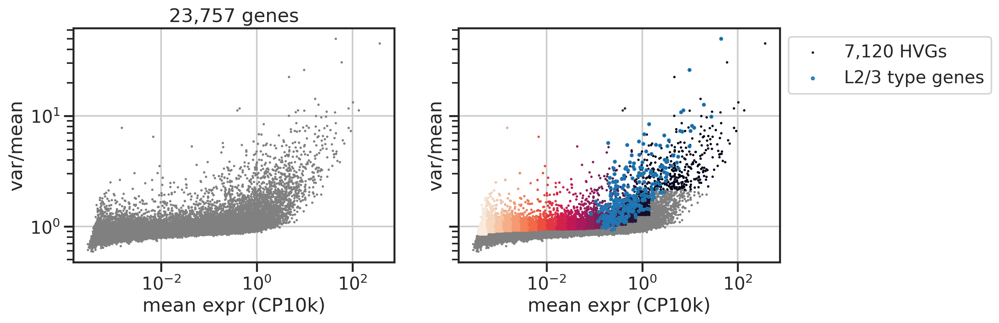

In [13]:
fig, axs = plt.subplots(1,2, figsize=(6*2,4), sharex=True, sharey=True)
ax = axs[0]
ax.scatter(gm, gv/gm, s=5, edgecolor='none', color='gray')
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlabel('mean expr (CP10k)')
ax.set_ylabel('var/mean')
ax.set_title(f'{len(gm):,} genes')

ax = axs[1]
ax.scatter(gm, gv/gm, s=5, edgecolor='none', color='gray')
ax.scatter(gm[gsel_idx], (gv/gm)[gsel_idx], c=lbl[gsel_idx], s=5, edgecolor='none', cmap='rocket_r', label=f'{len(gsel_idx):,} HVGs')
ax.scatter(gm[l23_gidx], (gv/gm)[l23_gidx], s=5, facecolors='none', edgecolor='C0', label='L2/3 type genes')
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlabel('mean expr (CP10k)')
ax.set_ylabel('var/mean')
ax.legend(bbox_to_anchor=(1,1))

plt.show()

In [14]:
# adata = adata_sub[:,gsel_idx]
adata = adata_sub[:,l23_gidx]
genes_sel = adata.var.index.values
adata

View of AnnData object with n_obs × n_vars = 21269 × 286
    obs: 'Class_broad', 'Doublet', 'Doublet Score', 'batch', 'leiden', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'Type', 'Subclass', 'cond', 'newtype', 'easitype'
    layers: 'norm', 'lognorm'

In [15]:
def pca_pipe(adata):
    
    np.random.seed(0)
    pca = PCA(n_components=4)
    
    zlognorm = zscore(np.array(adata.layers['lognorm'].todense()), axis=0)
    zlognorm = np.nan_to_num(zlognorm, 0)
    
    pcs = pca.fit_transform(zlognorm) # auto centering
    
    return zlognorm-np.mean(zlognorm, axis=0), pca, pcs # manual centering

In [16]:
np.random.seed(0)

X, pca, pcs = pca_pipe(adata)
V = pca.components_.T
V[:,1] = -V[:,1]
pcs[:,1] = -pcs[:,1]

In [17]:
adata.obsm['pcs'] = pcs

In [18]:
adata_nr28 = adata[adata.obs['cond']=='P28NR']
adata_dr28 = adata[adata.obs['cond']=='P28DR']

adata_nr38 = adata[adata.obs['cond']=='P38NR']
adata_dr38 = adata[adata.obs['cond']=='P38DR']

adata_dl28 = adata[adata.obs['cond']=='P28DL']

In [19]:
adata_nr28_1 = adata[adata.obs['sample'].apply(lambda x: 'P28_1' in x)]
adata_nr28_2 = adata[adata.obs['sample'].apply(lambda x: 'P28_2' in x)]

adata_nr38_1 = adata[adata.obs['sample'].apply(lambda x: 'P38_1' in x)]
adata_nr38_2 = adata[adata.obs['sample'].apply(lambda x: 'P38_2' in x)]
adata_nr38_1.shape, adata_nr38_2.shape

((720, 286), (1977, 286))

In [20]:
def organize_pc_res(adata, pcs):
    """
    """
    df = adata.obs.join(pd.DataFrame(pcs, 
                                     index=adata.obs.index, 
                                     columns=np.char.add("PC", (1+np.arange(pcs.shape[1])).astype(str))))
    return df

In [21]:
df_nr28 = organize_pc_res(adata_nr28, adata_nr28.obsm['pcs'])
df_dr28 = organize_pc_res(adata_dr28, adata_dr28.obsm['pcs'])
df_dl28 = organize_pc_res(adata_dl28, adata_dl28.obsm['pcs'])

df_nr38 = organize_pc_res(adata_nr38, adata_nr38.obsm['pcs'])
df_dr38 = organize_pc_res(adata_dr38, adata_dr38.obsm['pcs'])

In [22]:
prj_nr28 = adata_nr28.obsm['pcs'][:,:2]
prj_dr28 = adata_dr28.obsm['pcs'][:,:2]
prj_dl28 = adata_dl28.obsm['pcs'][:,:2]

prj_nr38 = adata_nr38.obsm['pcs'][:,:2]
prj_dr38 = adata_dr38.obsm['pcs'][:,:2]

In [23]:
labels = ['P28NR', 'P28DR', 'P28DL', 'P38NR', 'P38DR',]
prjs = [prj_nr28, prj_dr28, prj_dl28, prj_nr38, prj_dr38,]
dfs = [df_nr28, df_dr28, df_dl28, df_nr38, df_dr38]

In [24]:
palette_type = collections.OrderedDict({
    "L2/3_A": "C0",
    "L2/3_B": "C1",
    "L2/3_C": "C2",
})
palette_type_list = [c for i, c in palette_type.items()]

saved the figure to: /u/home/f/f7xiesnm/project-zipursky/v1-bb/ms_reanalysis/grad_scatter_2023-10-12.pdf


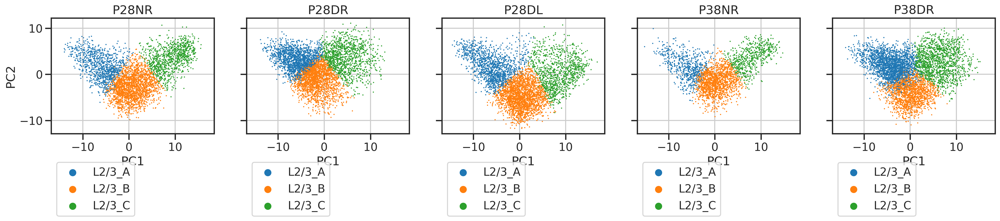

In [25]:
fig, axs = plt.subplots(1, 5, figsize=(5*5,1*4), sharex=True, sharey=True)
for ax, df, lbl in zip(axs, dfs, labels):
    sns.scatterplot(data=df, x='PC1', y='PC2', hue='newtype', s=3, edgecolor='none', palette=palette_type, hue_order=list(palette_type), 
                    rasterized=True,
                    ax=ax)
    ax.legend(bbox_to_anchor=(0,-0.2), loc='upper left')
    ax.set_title(lbl)
    ax.set_aspect('equal')

output = os.path.join(outfigdir, 'grad_scatter.pdf')
powerplots.savefig_autodate(fig, output)
plt.show()

saved the figure to: /u/home/f/f7xiesnm/project-zipursky/v1-bb/ms_reanalysis/grad_scatter2_2023-10-12.pdf


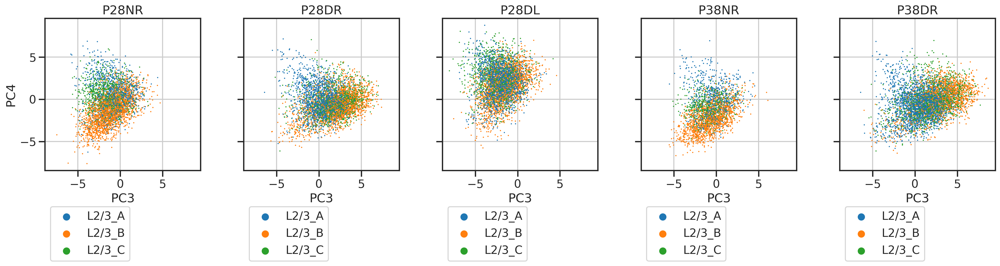

In [26]:
fig, axs = plt.subplots(1, 5, figsize=(5*5,1*4), sharex=True, sharey=True)
for ax, df, lbl in zip(axs, dfs, labels):
    sns.scatterplot(data=df, x='PC3', y='PC4', hue='newtype', s=3, edgecolor='none', palette=palette_type, hue_order=list(palette_type), 
                    rasterized=True,
                    ax=ax)
    ax.legend(bbox_to_anchor=(0,-0.2), loc='upper left')
    ax.set_title(lbl)
    ax.set_aspect('equal')

output = os.path.join(outfigdir, 'grad_scatter2.pdf')
powerplots.savefig_autodate(fig, output)
plt.show()

saved the figure to: /u/home/f/f7xiesnm/project-zipursky/v1-bb/ms_reanalysis/grad_heatmap_2023-10-12.pdf


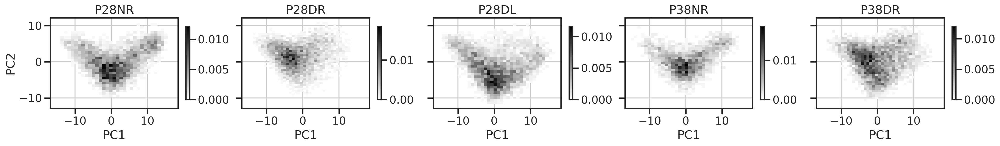

In [27]:
fig, axs = plt.subplots(1, 5, figsize=(5*5,1*4), sharex=True, sharey=True)
for ax, df, lbl in zip(axs, dfs, labels):
    sns.histplot(ax=ax, data=df, stat='density', x='PC1', y='PC2', cmap='gray_r', cbar=True, cbar_kws=dict(shrink=0.5))
    # ax.legend(bbox_to_anchor=(0,-0.2), loc='upper left')
    ax.set_title(lbl)
    ax.set_aspect('equal')
output = os.path.join(outfigdir, 'grad_heatmap.pdf')
powerplots.savefig_autodate(fig, output)
plt.show()

saved the figure to: /u/home/f/f7xiesnm/project-zipursky/v1-bb/ms_reanalysis/grad_kde_2023-10-12.pdf


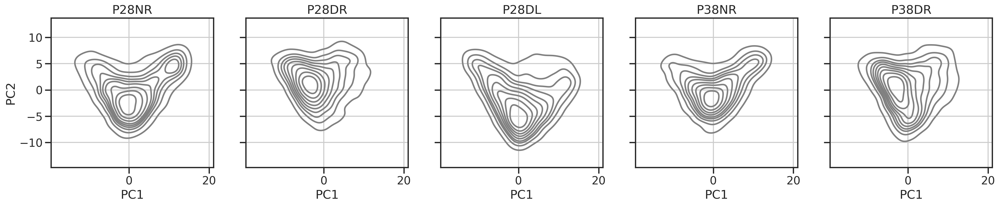

In [28]:
fig, axs = plt.subplots(1, 5, figsize=(5*5,1*4), sharex=True, sharey=True)
for ax, df, lbl in zip(axs, dfs, labels):
    sns.kdeplot(data=df, x='PC1', y='PC2', color='gray', zorder=2, ax=ax)
    ax.set_title(lbl)
output = os.path.join(outfigdir, 'grad_kde.pdf')
powerplots.savefig_autodate(fig, output)
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


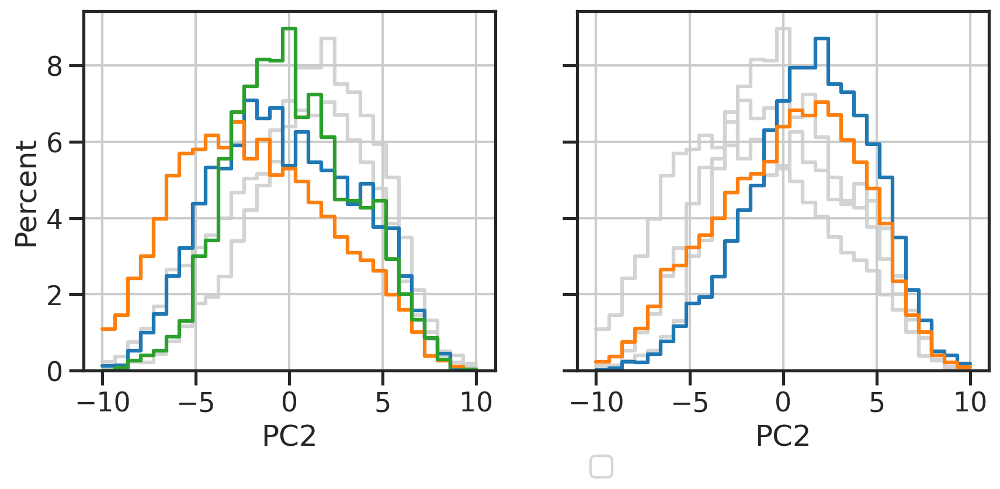

In [29]:
bins = np.linspace(-10, 10, 30) 
fig, axs = plt.subplots(1, 2, figsize=(5*2,1*4), sharex=True, sharey=True)
ax = axs[0]
for df, lbl in zip(dfs, labels):
    sns.histplot(ax=ax, data=df, x='PC2', stat='percent', cumulative=False, bins=bins, 
                 element='step', fill=False, color='lightgray', zorder=0,
                )
    if 'NR' in lbl or 'DL' in lbl:
        sns.histplot(ax=ax, data=df, x='PC2', stat='percent', cumulative=False, bins=bins, 
                     element='step', fill=False, 
                    )
        
ax = axs[1]
for df, lbl in zip(dfs, labels):
    sns.histplot(ax=ax, data=df, x='PC2', stat='percent', cumulative=False, bins=bins, 
                 element='step', fill=False, color='lightgray', zorder=0,
                )
    if 'DR' in lbl:
        sns.histplot(ax=ax, data=df, x='PC2', stat='percent', cumulative=False, bins=bins, 
                     element='step', fill=False, 
                    )
        
ax.legend(bbox_to_anchor=(0,-0.2), loc='upper left')
plt.show()

# Archetype

In [30]:
from py_pcha import PCHA

In [31]:
def get_dists_to_specialists(prj, XC):
    """
    """
    diffs = np.array([prj-XC[:,0], prj-XC[:,1], prj-XC[:,2]]) # specialist by cell by dim
    dists = np.sqrt(np.sum(np.power(diffs, 2), axis=2)) # specialist by cell
    # print(diffs.shape, dists.shape)
    return dists

In [32]:
np.random.seed(0)
XC_dict = {}
for lbl, prj in zip(labels, prjs): 
    X = prj.T
    XC, S, C, SSE, varexpl = PCHA(X, noc=3, delta=0)
    XC = np.array(XC)
    XC = XC[:,np.argsort(XC[0])].copy() # order this
    print(XC.shape, S.shape, C.shape, SSE.shape, varexpl.shape, SSE, varexpl)
    XC_dict[lbl] = XC

(2, 3) (3, 4044) (4044, 3) () () 477.8885124910739 0.9976418199047603
(2, 3) (3, 4704) (4704, 3) () () 903.2947727893188 0.9949757826564879
(2, 3) (3, 4659) (4659, 3) () () 899.4161397029529 0.9964082246059187
(2, 3) (3, 2697) (2697, 3) () () 149.9646247136552 0.9985678254003594
(2, 3) (3, 5165) (5165, 3) () () 1111.6082853651023 0.9946481458617806


In [33]:
dists_dict = {}
for lbl, prj in zip(labels, prjs): 
    XC  = XC_dict[lbl]
    dists = get_dists_to_specialists(prj, XC)
    dists_dict[lbl] = dists

In [34]:
dists_dict2 = {}
for lbl, prj in zip(labels, prjs): 
    XC  = XC_dict['P28NR']
    dists = get_dists_to_specialists(prj, XC)
    dists_dict2[lbl] = dists

saved the figure to: /u/home/f/f7xiesnm/project-zipursky/v1-bb/ms_reanalysis/grad_archetype_2023-10-12.pdf


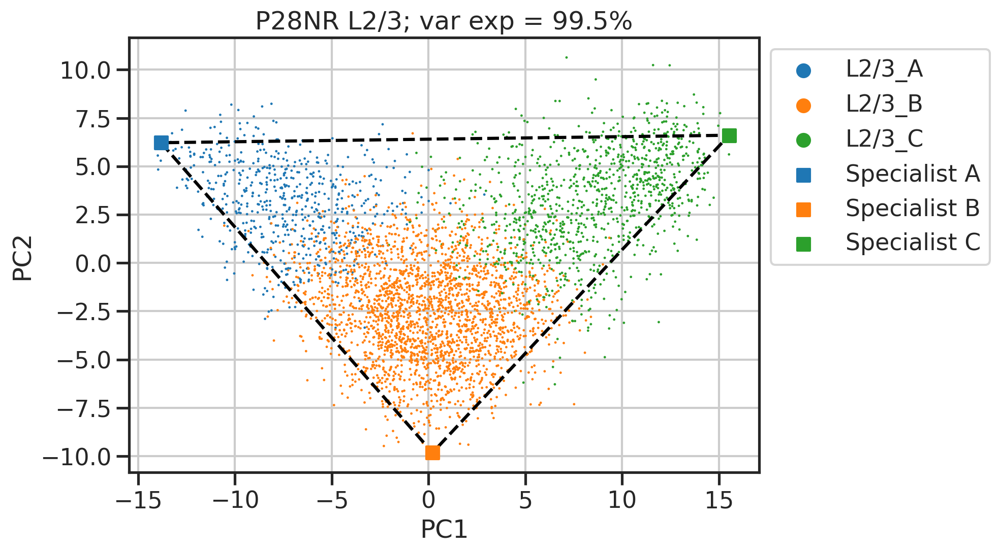

In [35]:
XC = XC_dict['P28NR']
df = df_nr28

fig, ax = plt.subplots(figsize=(8,6))
sns.scatterplot(data=df, x='PC1', y='PC2', hue='easitype', s=3, palette=palette_type, hue_order=list(palette_type), edgecolor='none', ax=ax)
ax.plot(XC[0].tolist()+[XC[0,0]], XC[1].tolist()+[XC[1,0]], '--k', label='', zorder=1)
ax.scatter(XC[0,[0]], XC[1,[0]], color='C0', marker='s', label='Specialist A')
ax.scatter(XC[0,[1]], XC[1,[1]], color='C1', marker='s', label='Specialist B')
ax.scatter(XC[0,[2]], XC[1,[2]], color='C2', marker='s', label='Specialist C')
ax.legend(bbox_to_anchor=(1,1))
ax.set_aspect('equal')
ax.set_title(f'P28NR L2/3; var exp = {100*varexpl:.1f}%')
output = os.path.join(outfigdir, 'grad_archetype.pdf')
powerplots.savefig_autodate(fig, output)
plt.show()

saved the figure to: /u/home/f/f7xiesnm/project-zipursky/v1-bb/ms_reanalysis/grad_archetype_2_2023-10-12.pdf


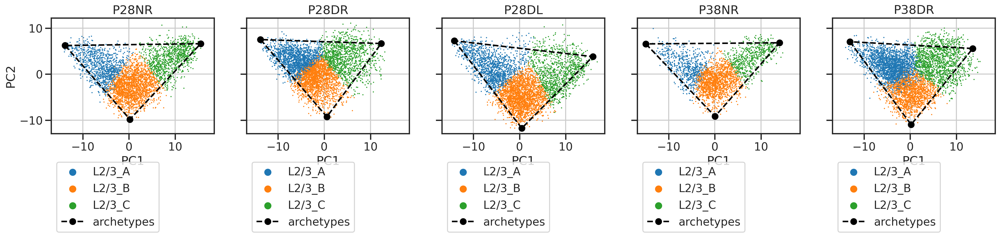

In [36]:
fig, axs = plt.subplots(1, 5, figsize=(5*5,1*4), sharex=True, sharey=True)
for ax, df, lbl in zip(axs, dfs, labels):
    XC = XC_dict[lbl]
    sns.scatterplot(data=df, x='PC1', y='PC2', hue='newtype', s=3, edgecolor='none', palette=palette_type, hue_order=list(palette_type), 
                    rasterized=True,
                    ax=ax)
    ax.plot(XC[0].tolist()+[XC[0,0]], XC[1].tolist()+[XC[1,0]], '--ok', label='archetypes')
    ax.legend(bbox_to_anchor=(0,-0.2), loc='upper left')
    ax.set_title(lbl)
    ax.set_aspect('equal')

output = os.path.join(outfigdir, 'grad_archetype_2.pdf')
powerplots.savefig_autodate(fig, output)
plt.show()

saved the figure to: /u/home/f/f7xiesnm/project-zipursky/v1-bb/ms_reanalysis/grad_archetype_3_2023-10-12.pdf


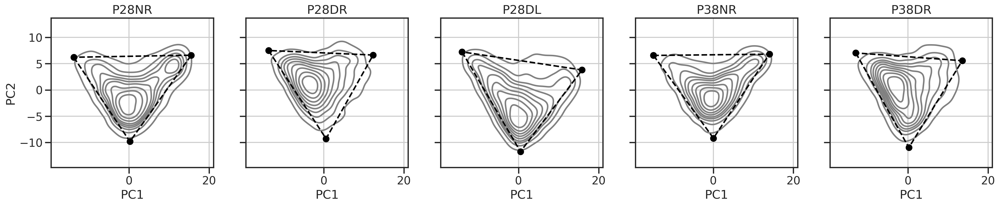

In [37]:
fig, axs = plt.subplots(1, 5, figsize=(5*5,1*4), sharex=True, sharey=True)
for ax, df, lbl in zip(axs, dfs, labels):
    XC = XC_dict[lbl]
    sns.kdeplot(data=df, x='PC1', y='PC2', color='gray', zorder=2, ax=ax)
    ax.plot(XC[0].tolist()+[XC[0,0]], XC[1].tolist()+[XC[1,0]], '--ok', label='archetypes')
    ax.set_title(lbl)
output = os.path.join(outfigdir, 'grad_archetype_3.pdf')
powerplots.savefig_autodate(fig, output)
plt.show()

saved the figure to: /u/home/f/f7xiesnm/project-zipursky/v1-bb/ms_reanalysis/grad_archetype_4_2023-10-12.pdf


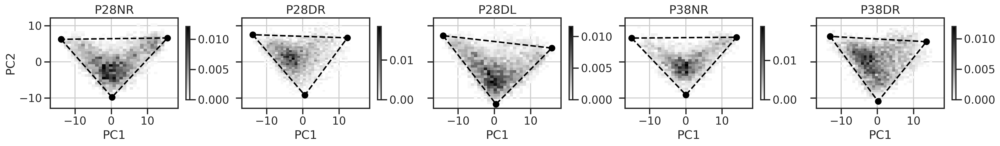

In [38]:
fig, axs = plt.subplots(1, 5, figsize=(5*5,1*4), sharex=True, sharey=True)
for ax, df, lbl in zip(axs, dfs, labels):
    XC = XC_dict[lbl]
    sns.histplot(ax=ax, data=df, stat='density', x='PC1', y='PC2', cmap='gray_r', cbar=True, cbar_kws=dict(shrink=0.5))
    # ax.legend(bbox_to_anchor=(0,-0.2), loc='upper left')
    ax.plot(XC[0].tolist()+[XC[0,0]], XC[1].tolist()+[XC[1,0]], '--ok', label='archetypes')
    ax.set_title(lbl)
    ax.set_aspect('equal')
output = os.path.join(outfigdir, 'grad_archetype_4.pdf')
powerplots.savefig_autodate(fig, output)
plt.show()

# Optimal Transport

In [39]:
import ot
import ot.plot
from matplotlib import collections as mc

In [40]:
def OT_pipe(xs, xt):
    """
    xs = X_nr28.dot(V)[:,:2]
    xt = X_dr28.dot(V)[:,:2]
    """
    ns = len(xs)
    nt = len(xt)
    a = np.ones((ns,))/ns
    b = np.ones((nt,))/nt
    print(xs.shape, xt.shape)
    
    # ~5 sec for 4k cells vs 4k cells
    M = ot.dist(xs, xt)
    G0 = ot.emd(a, b, M)
    G0n = G0/np.array(G0.sum(axis=1)+1e-10).reshape(-1,1) #.shape
    
    # organize results (ns, nt)
    G0ns = sparse.coo_matrix(G0n)
    
    # per source cell vector
    alli, allj, allw = G0ns.row, G0ns.col, G0ns.data
    tmp = pd.DataFrame((xt[allj] - xs[alli])*allw.reshape(-1,1))
    tmp[2] = alli
    arrows = tmp.groupby(2).sum().reindex(np.arange(ns)).values
    
    # organize per cell vector 
    arrows = pd.DataFrame(arrows, columns=['dx', 'dy'])
    arrows['x'] = xs[:,0]
    arrows['y'] = xs[:,1]
    arrows['xbin'] = pd.cut(xs[:,0], 20, labels=False)
    arrows['ybin'] = pd.cut(xs[:,1], 20, labels=False)
    
    # local mean field
    n_arrows = arrows.groupby(['xbin', 'ybin']).size()
    n_arrows = n_arrows[n_arrows!=0]
    mean_arrows = arrows.groupby(['xbin', 'ybin']).mean().reindex(n_arrows.index).fillna(0) #.dropna()
    
    mags = np.sqrt(arrows['dx']**2+arrows['dy']**2)  # n_arrows # [[2,3]] #*n_arrows
    mean_mags = np.mean(mags)
    
    return G0ns, arrows, n_arrows, mean_arrows, mean_mags
    

In [41]:
def OT_pipe_ext_control(xs, xt, xc):
    """
    xs = X_nr28.dot(V)[:,:2]
    xt = X_dr28.dot(V)[:,:2]
    """
    G0ns, arrows, n_arrows, mean_arrows, mean_mags = OT_pipe(xs, xt)
    _, _, _, mean_arrows_ctrl, mean_mags_ctrl = OT_pipe(xs, xc)

    mags = np.sqrt(np.sum(np.power(mean_arrows[['dx', 'dy']],2), axis=1))
    mags_ctrl = np.sqrt(np.sum(np.power(mean_arrows_ctrl[['dx', 'dy']],2), axis=1))
    downplay = np.clip((1-mags_ctrl/(mags+1e-10)), 0, None)

    mean_arrows_corrected = mean_arrows.copy()
    mean_arrows_corrected['dx'] = downplay*mean_arrows['dx']
    mean_arrows_corrected['dy'] = downplay*mean_arrows['dy']
    
    mags_corrected = np.sqrt(mean_arrows_corrected['dx']**2+mean_arrows_corrected['dy']**2)
    mean_mags_corrected = np.sum(n_arrows*mags_corrected)/np.sum(n_arrows)

    return (n_arrows, 
            mean_arrows, mean_arrows_corrected,
            mean_mags, mean_mags_corrected,
            )


In [42]:
def OT_plot(n_arrows, mean_arrows, XC, output=None):
    """
    """
    maxsize = np.max(n_arrows)
    minsize = np.min(n_arrows)
    print(minsize, maxsize)

    fig, ax = plt.subplots()
    for size, arrow in zip(n_arrows.values, mean_arrows[['x', 'y', 'dx', 'dy']].values):
        ax.arrow(*arrow, linewidth=0.5, width=0.1, color='k', alpha=size/maxsize)

    ax.scatter(XC[0,[0]], XC[1,[0]], color='C0', marker='s', label='Specialist A')
    ax.scatter(XC[0,[1]], XC[1,[1]], color='C1', marker='s', label='Specialist B')
    ax.scatter(XC[0,[2]], XC[1,[2]], color='C2', marker='s', label='Specialist C')
    ax.plot(XC[0].tolist()+[XC[0,0]], XC[1].tolist()+[XC[1,0]], '--k', label='pareto front')
    ax.grid(False)
    ax.legend(bbox_to_anchor=(1,1))
    if output:
        powerplots.savefig_autodate(fig, output)
    plt.show()

In [43]:
ot_res = dict()
XC = XC_dict['P28NR']

(4044, 2) (4704, 2)


/u/home/f/f7xiesnm/.conda/envs/napari/lib/python3.9/site-packages/ot/lp/__init__.py:354: UserWarning: numItermax reached before optimality. Try to increase numItermax.
  result_code_string = check_result(result_code)


(4044, 2) (2697, 2)


/u/home/f/f7xiesnm/.conda/envs/napari/lib/python3.9/site-packages/ot/lp/__init__.py:354: UserWarning: numItermax reached before optimality. Try to increase numItermax.
  result_code_string = check_result(result_code)


1 73
saved the figure to: /u/home/f/f7xiesnm/project-zipursky/v1-bb/ms_reanalysis/ot_nrdr_p28_2023-10-12.pdf


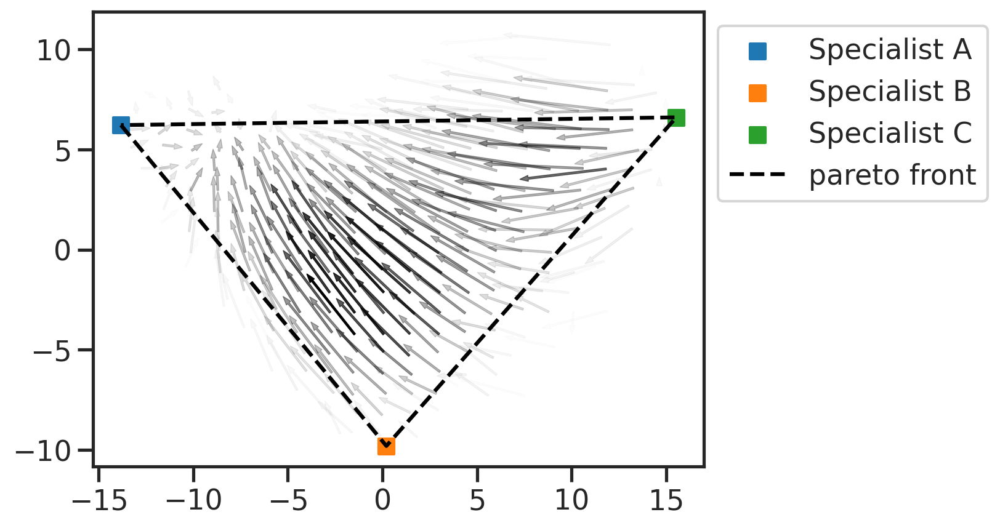

1 73
saved the figure to: /u/home/f/f7xiesnm/project-zipursky/v1-bb/ms_reanalysis/ot_nrdr_p28_crr_2023-10-12.pdf


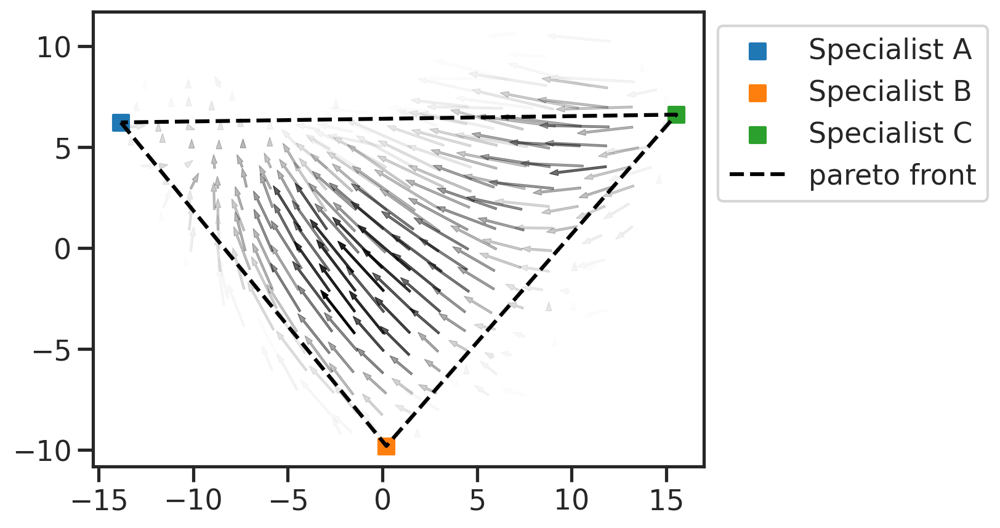

In [44]:
xs = prj_nr28
xt = prj_dr28 
xc = prj_nr38

(n_arrows, 
 mean_arrows, mean_arrows_corrected, 
 mean_mags, mean_mags_corrected,) = OT_pipe_ext_control(xs, xt, xc)


ot_res['NR vs DR (P28)'] = (n_arrows, mean_arrows, mean_arrows_corrected, mean_mags, mean_mags_corrected,)

output = os.path.join(outfigdir, 'ot_nrdr_p28.pdf')
OT_plot(n_arrows, mean_arrows, XC, 
        output=output, 
       )

output = os.path.join(outfigdir, 'ot_nrdr_p28_crr.pdf')
OT_plot(n_arrows, mean_arrows_corrected, XC, 
        output=output, 
       )

(2071, 2) (4704, 2)


/u/home/f/f7xiesnm/.conda/envs/napari/lib/python3.9/site-packages/ot/lp/__init__.py:354: UserWarning: numItermax reached before optimality. Try to increase numItermax.
  result_code_string = check_result(result_code)


(2071, 2) (1973, 2)
1 35
saved the figure to: /u/home/f/f7xiesnm/project-zipursky/v1-bb/ms_reanalysis/ot_nrdr_p28_2_2023-10-12.pdf


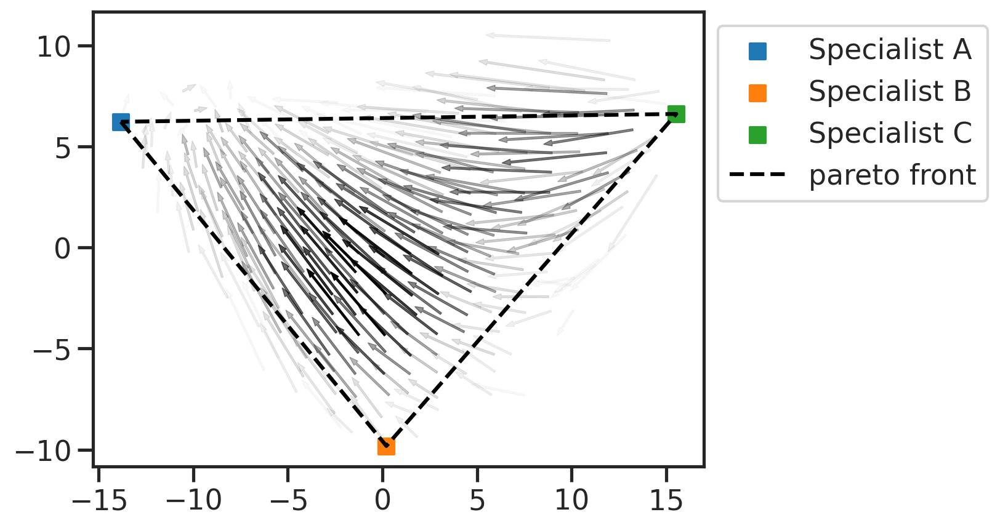

1 35
saved the figure to: /u/home/f/f7xiesnm/project-zipursky/v1-bb/ms_reanalysis/ot_nrdr_p28_2_crr_2023-10-12.pdf


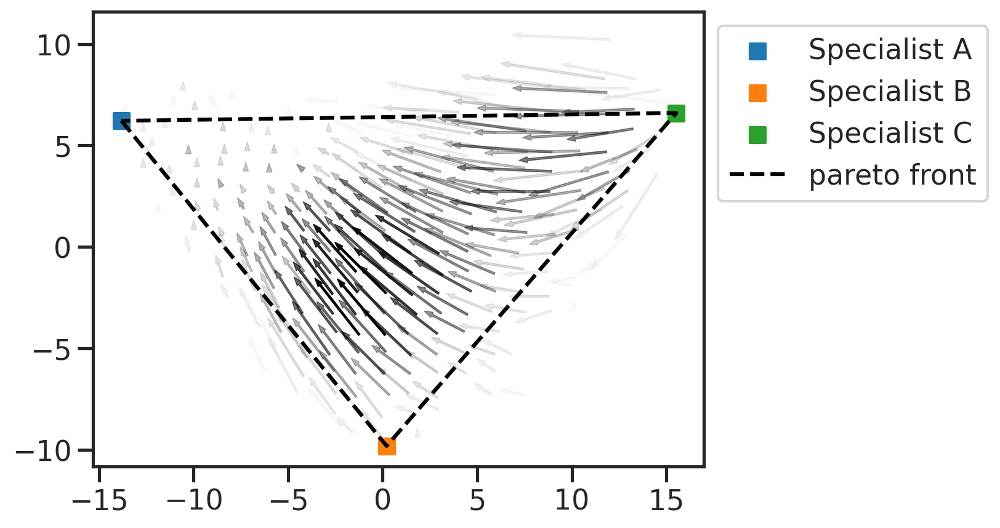

In [45]:
xs = adata_nr28_1.obsm['pcs'][:,:2]
xt = adata_dr28.obsm['pcs'][:,:2]
xc = adata_nr28_2.obsm['pcs'][:,:2]

(n_arrows, 
 mean_arrows, mean_arrows_corrected, 
 mean_mags, mean_mags_corrected,) = OT_pipe_ext_control(xs, xt, xc)

ot_res['NR vs DR (P28) (2)'] = (n_arrows, mean_arrows, mean_arrows_corrected, mean_mags, mean_mags_corrected,)
output = os.path.join(outfigdir, 'ot_nrdr_p28_2.pdf')
OT_plot(n_arrows, mean_arrows, XC, output=output)
output = os.path.join(outfigdir, 'ot_nrdr_p28_2_crr.pdf')
OT_plot(n_arrows, mean_arrows_corrected, XC, output=output)

(2697, 2) (5165, 2)


/u/home/f/f7xiesnm/.conda/envs/napari/lib/python3.9/site-packages/ot/lp/__init__.py:354: UserWarning: numItermax reached before optimality. Try to increase numItermax.
  result_code_string = check_result(result_code)


(2697, 2) (4044, 2)


/u/home/f/f7xiesnm/.conda/envs/napari/lib/python3.9/site-packages/ot/lp/__init__.py:354: UserWarning: numItermax reached before optimality. Try to increase numItermax.
  result_code_string = check_result(result_code)


1 60
saved the figure to: /u/home/f/f7xiesnm/project-zipursky/v1-bb/ms_reanalysis/ot_nrdr_p38_2023-10-12.pdf


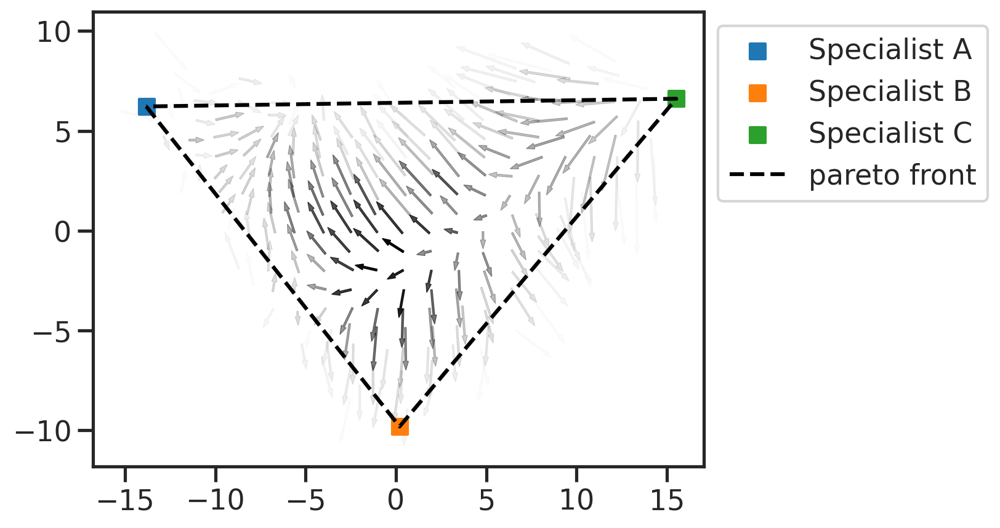

1 60
saved the figure to: /u/home/f/f7xiesnm/project-zipursky/v1-bb/ms_reanalysis/ot_nrdr_p38_crr_2023-10-12.pdf


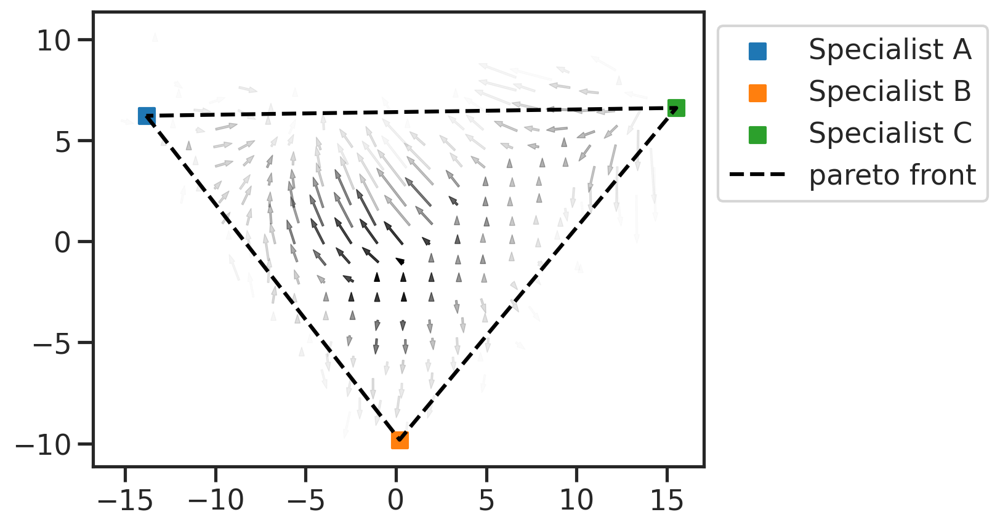

In [46]:
xs = prj_nr38
xt = prj_dr38 
xc = prj_nr28

(n_arrows, 
 mean_arrows, mean_arrows_corrected, 
 mean_mags, mean_mags_corrected,) = OT_pipe_ext_control(xs, xt, xc)

ot_res['NR vs DR (P38)'] = (n_arrows, mean_arrows, mean_arrows_corrected, mean_mags, mean_mags_corrected,)
output = os.path.join(outfigdir, 'ot_nrdr_p38.pdf')
OT_plot(n_arrows, mean_arrows, XC, output=output)
output = os.path.join(outfigdir, 'ot_nrdr_p38_crr.pdf')
OT_plot(n_arrows, mean_arrows_corrected, XC, output=output)

(4704, 2) (4659, 2)


/u/home/f/f7xiesnm/.conda/envs/napari/lib/python3.9/site-packages/ot/lp/__init__.py:354: UserWarning: numItermax reached before optimality. Try to increase numItermax.
  result_code_string = check_result(result_code)


(4704, 2) (5165, 2)


/u/home/f/f7xiesnm/.conda/envs/napari/lib/python3.9/site-packages/ot/lp/__init__.py:354: UserWarning: numItermax reached before optimality. Try to increase numItermax.
  result_code_string = check_result(result_code)


1 89
saved the figure to: /u/home/f/f7xiesnm/project-zipursky/v1-bb/ms_reanalysis/ot_drdl_p28_2023-10-12.pdf


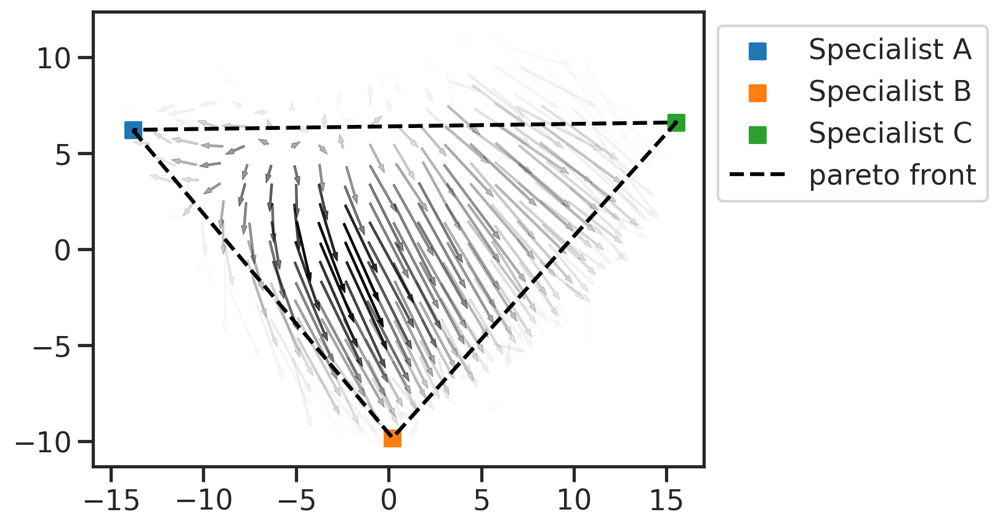

1 89
saved the figure to: /u/home/f/f7xiesnm/project-zipursky/v1-bb/ms_reanalysis/ot_drdl_p28_crr_2023-10-12.pdf


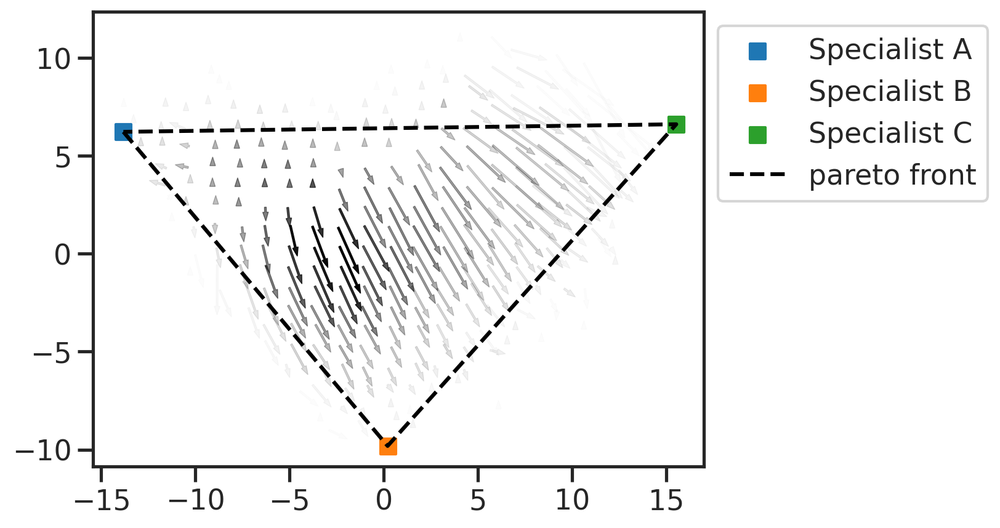

In [47]:
xs = adata_dr28.obsm['pcs'][:,:2]
xt = adata_dl28.obsm['pcs'][:,:2]
xc = adata_dr38.obsm['pcs'][:,:2]

(n_arrows, 
 mean_arrows, mean_arrows_corrected, 
 mean_mags, mean_mags_corrected,) = OT_pipe_ext_control(xs, xt, xc)

ot_res['DR vs DL (P28)'] = (n_arrows, mean_arrows, mean_arrows_corrected, mean_mags, mean_mags_corrected,)
output = os.path.join(outfigdir, 'ot_drdl_p28.pdf')
OT_plot(n_arrows, mean_arrows, XC, output=output)
output = os.path.join(outfigdir, 'ot_drdl_p28_crr.pdf')
OT_plot(n_arrows, mean_arrows_corrected, XC, output=output)

(720, 2) (5165, 2)
(720, 2) (1977, 2)
1 12
saved the figure to: /u/home/f/f7xiesnm/project-zipursky/v1-bb/ms_reanalysis/ot_nrdr_p38_2_2023-10-12.pdf


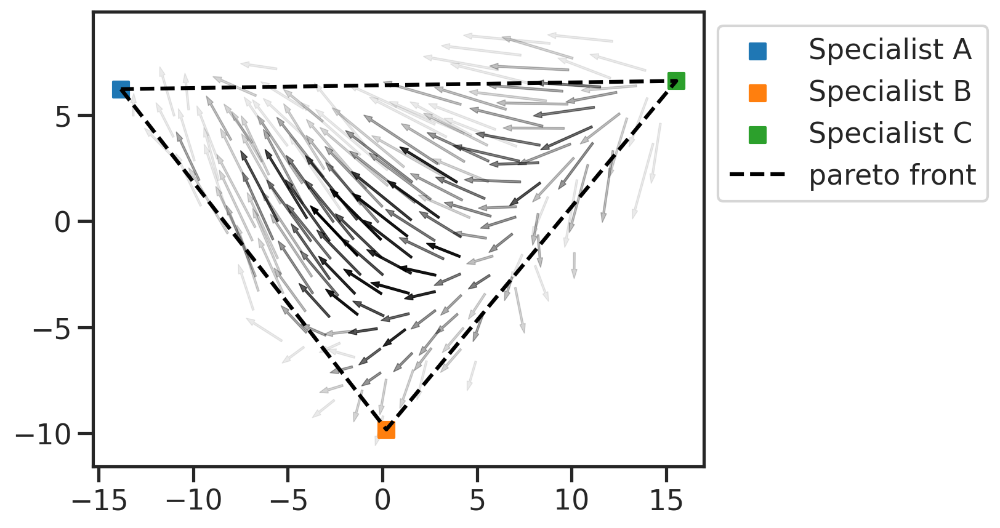

1 12
saved the figure to: /u/home/f/f7xiesnm/project-zipursky/v1-bb/ms_reanalysis/ot_nrdr_p38_2_crr_2023-10-12.pdf


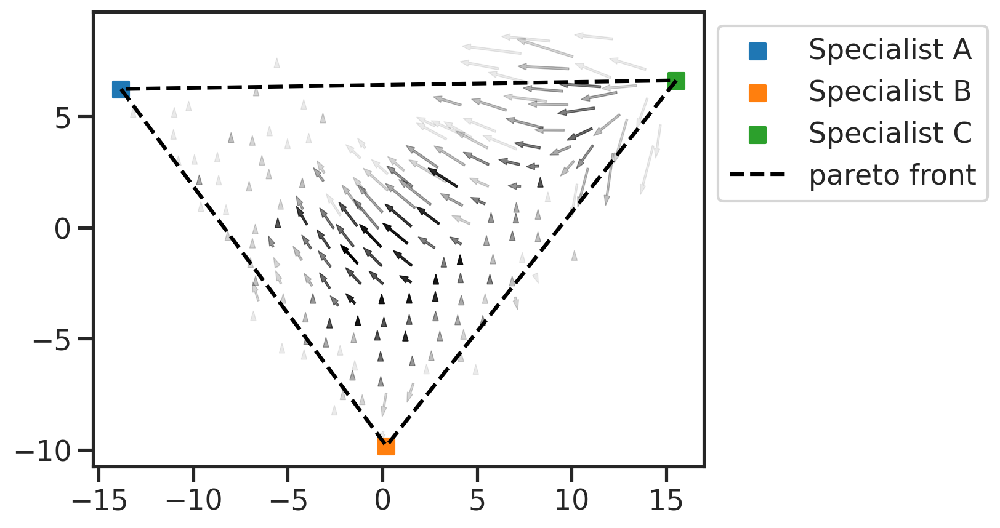

In [48]:
xs = adata_nr38_1.obsm['pcs'][:,:2]
xt = adata_dr38.obsm['pcs'][:,:2]
xc = adata_nr38_2.obsm['pcs'][:,:2]

(n_arrows, 
 mean_arrows, mean_arrows_corrected, 
 mean_mags, mean_mags_corrected,) = OT_pipe_ext_control(xs, xt, xc)

ot_res['NR vs DR (P38) (2)'] = (n_arrows, mean_arrows, mean_arrows_corrected, mean_mags, mean_mags_corrected,)
output = os.path.join(outfigdir, 'ot_nrdr_p38_2.pdf')
OT_plot(n_arrows, mean_arrows, XC, output=output)
output = os.path.join(outfigdir, 'ot_nrdr_p38_2_crr.pdf')
OT_plot(n_arrows, mean_arrows_corrected, XC, output=output)

(4044, 2) (2697, 2)


/u/home/f/f7xiesnm/.conda/envs/napari/lib/python3.9/site-packages/ot/lp/__init__.py:354: UserWarning: numItermax reached before optimality. Try to increase numItermax.
  result_code_string = check_result(result_code)


(4044, 2) (4704, 2)


/u/home/f/f7xiesnm/.conda/envs/napari/lib/python3.9/site-packages/ot/lp/__init__.py:354: UserWarning: numItermax reached before optimality. Try to increase numItermax.
  result_code_string = check_result(result_code)


1 73
saved the figure to: /u/home/f/f7xiesnm/project-zipursky/v1-bb/ms_reanalysis/ot_p28p38_2023-10-12.pdf


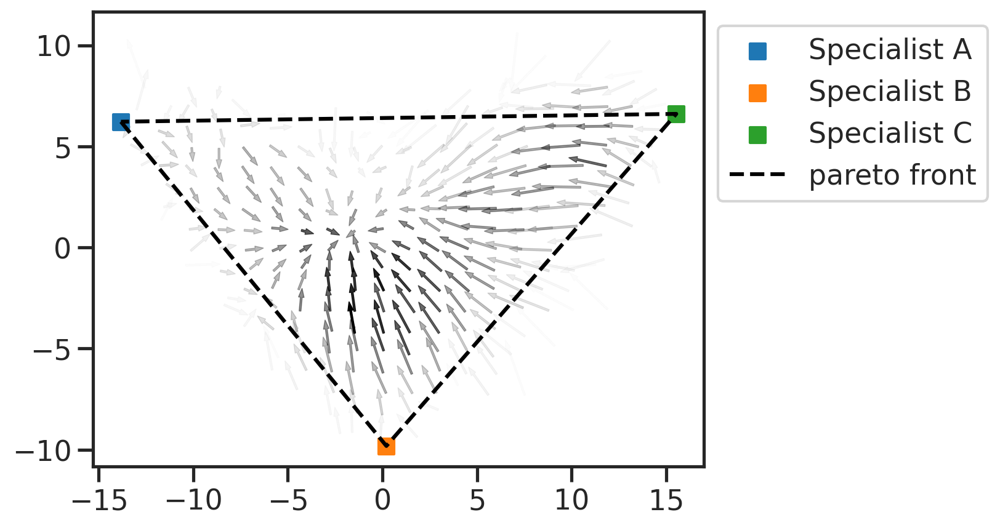

1 73
saved the figure to: /u/home/f/f7xiesnm/project-zipursky/v1-bb/ms_reanalysis/ot_p28p38_crr_2023-10-12.pdf


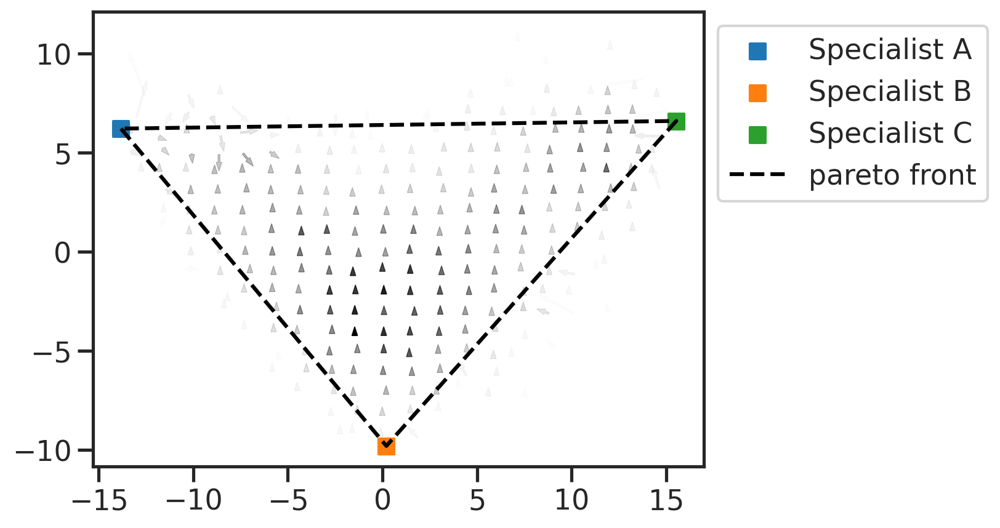

In [49]:
xs = adata_nr28.obsm['pcs'][:,:2]
xt = adata_nr38.obsm['pcs'][:,:2]
xc = adata_dr28.obsm['pcs'][:,:2]

(n_arrows, 
 mean_arrows, mean_arrows_corrected, 
 mean_mags, mean_mags_corrected,) = OT_pipe_ext_control(xs, xt, xc)

ot_res['P28 vs P38 (NR)'] = (n_arrows, mean_arrows, mean_arrows_corrected, mean_mags, mean_mags_corrected,)
output = os.path.join(outfigdir, 'ot_p28p38.pdf')
OT_plot(n_arrows, mean_arrows, XC, output=output)
output = os.path.join(outfigdir, 'ot_p28p38_crr.pdf')
OT_plot(n_arrows, mean_arrows_corrected, XC, output=output)

# quantify avg movement

In [50]:
bar1 = []
bar2 = []
keys = []
for key, item in ot_res.items():
    print(key, item[3], item[4])
    keys.append(key)
    bar1.append(item[3])
    bar2.append(item[4])

NR vs DR (P28) 3.2185661115236908 2.186113591269474
NR vs DR (P28) (2) 3.7709277114368556 2.6260612572072812
NR vs DR (P38) 1.325926146557193 0.45160653114428195
DR vs DL (P28) 3.2711879192510644 1.2699869362426315
NR vs DR (P38) (2) 2.4032630432379816 0.5026620049286481
P28 vs P38 (NR) 1.032333999667923 0.012480811546329379


saved the figure to: /u/home/f/f7xiesnm/project-zipursky/v1-bb/ms_reanalysis/bar_movement_2023-10-12.pdf


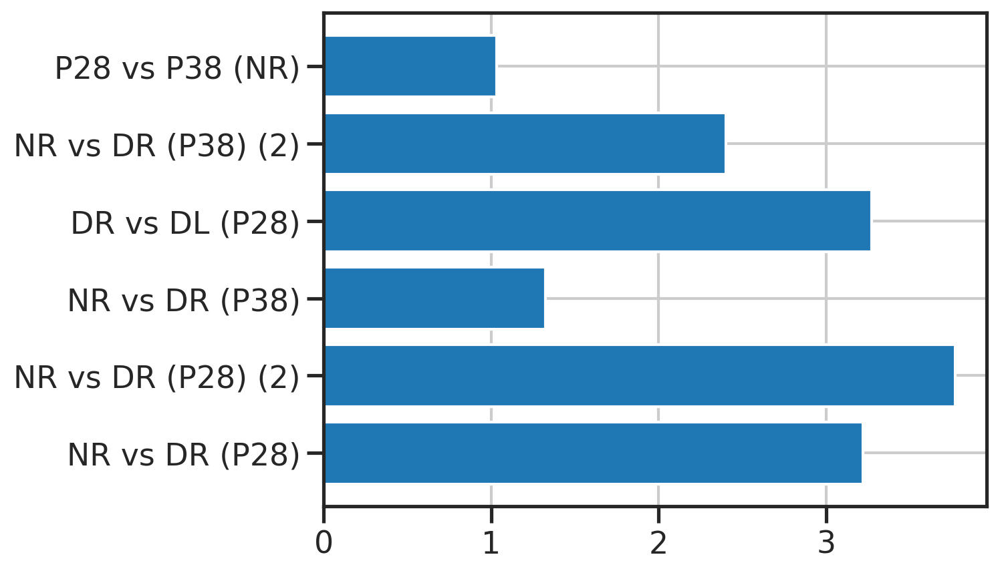

In [51]:
fig, ax = plt.subplots()
ax.barh(np.arange(len(bar1)), bar1)
ax.set_yticks(np.arange(len(bar1)))
ax.set_yticklabels(keys,)
output = os.path.join(outfigdir, 'bar_movement.pdf')
powerplots.savefig_autodate(fig, output)
plt.show()

<BarContainer object of 6 artists>

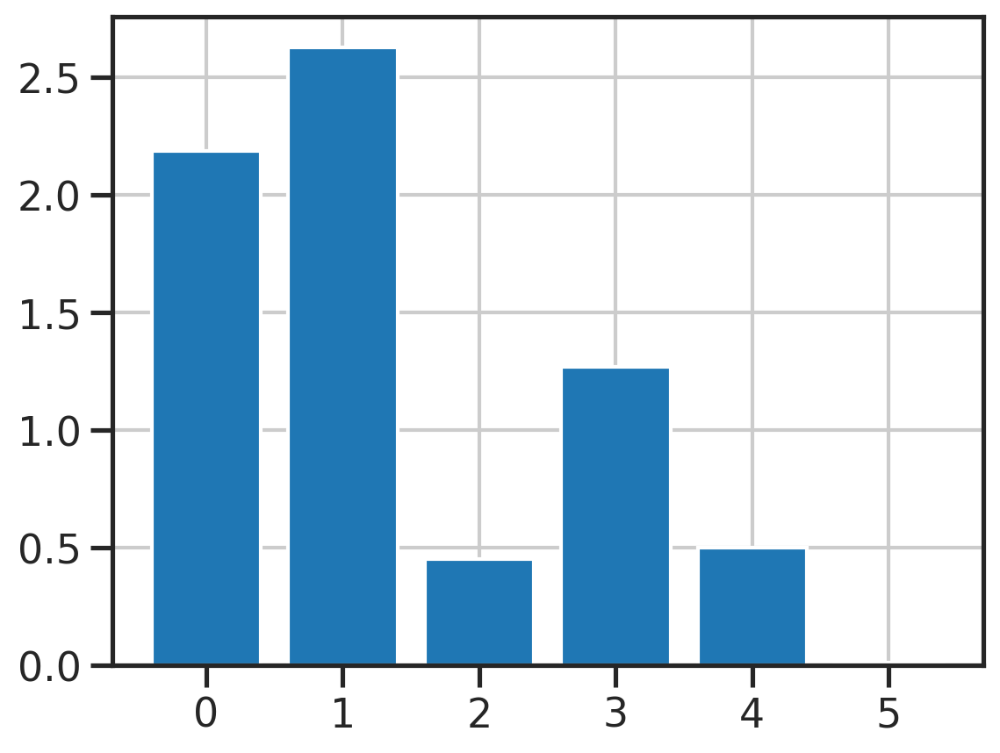

In [52]:
plt.bar(np.arange(len(bar2)), bar2)

# quantify A, B, C closeness

In [53]:
res_frac = pd.DataFrame(index=['A pole', 'B pole', 'C pole'])

for lbl in labels:
    unqs, cnts = np.unique(np.argmin(dists_dict[lbl], axis=0), return_counts=True)
    print(unqs, cnts/cnts.sum())
    res_frac[lbl] = cnts/cnts.sum()

[0 1 2] [0.17631058 0.59619189 0.22749753]
[0 1 2] [0.32142857 0.46215986 0.21641156]
[0 1 2] [0.20240395 0.60957287 0.18802318]
[0 1 2] [0.13199852 0.65072303 0.21727846]
[0 1 2] [0.28983543 0.45053243 0.25963214]


saved the figure to: /u/home/f/f7xiesnm/project-zipursky/v1-bb/ms_reanalysis/bar_frac_abc_pole_2023-10-12.pdf


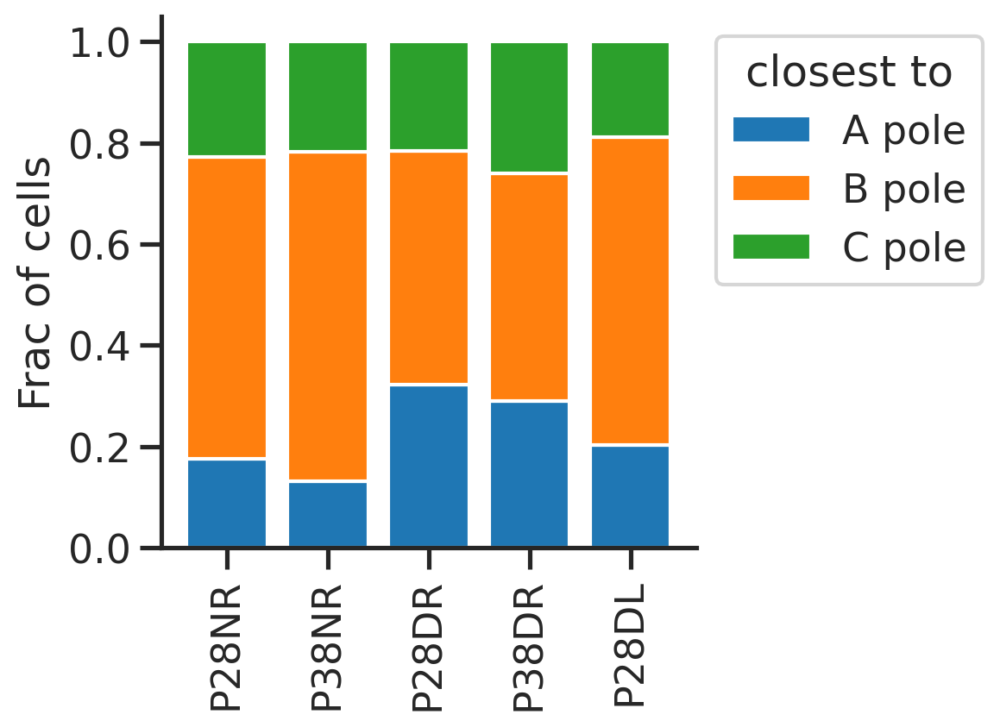

In [54]:
fig, ax = plt.subplots(figsize=(4,4))
res_frac[['P28NR', 'P38NR', 'P28DR', 'P38DR', 'P28DL']].T.plot.bar(
    ax=ax, stacked=True, width=0.8,  
)
ax.legend(bbox_to_anchor=(1,1), title='closest to')
sns.despine(ax=ax)
ax.set_ylabel('Frac of cells')
ax.grid(False)
output = os.path.join(outfigdir, 'bar_frac_abc_pole.pdf')
powerplots.savefig_autodate(fig, output)
plt.show()


# quantify distance to A, B

saved the figure to: /u/home/f/f7xiesnm/project-zipursky/v1-bb/ms_reanalysis/cumdist_a_2023-10-12.pdf


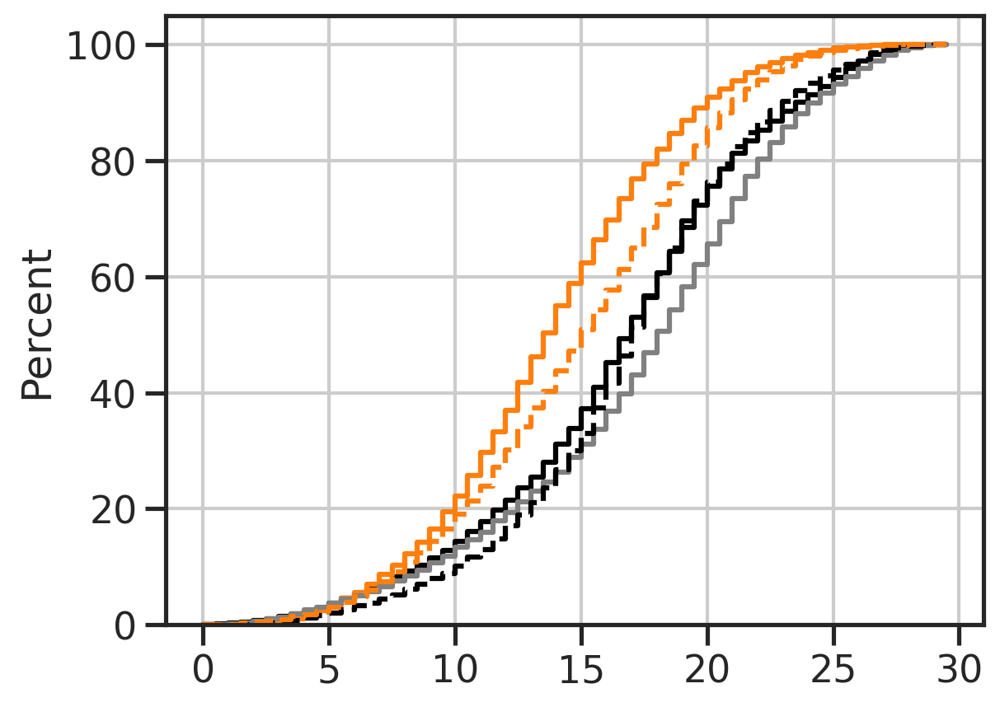

In [55]:
bins = np.arange(0,30,0.5) #linspace(0,30,30)

fig, ax = plt.subplots()
sns.histplot(dists_dict['P28NR'][0], ax=ax, stat='percent', element='step', cumulative=True, fill=False, color='k', bins=bins)
sns.histplot(dists_dict['P28DR'][0], ax=ax, stat='percent', element='step', cumulative=True, fill=False, color='C1', bins=bins)
sns.histplot(dists_dict['P28DL'][0], ax=ax, stat='percent', element='step', cumulative=True, fill=False, color='gray', bins=bins)

sns.histplot(dists_dict['P38NR'][0], ax=ax, stat='percent', element='step', cumulative=True, fill=False, color='k', linestyle='--', bins=bins)
sns.histplot(dists_dict['P38DR'][0], ax=ax, stat='percent', element='step', cumulative=True, fill=False, color='C1', linestyle='--', bins=bins)
output = os.path.join(outfigdir, 'cumdist_a.pdf')
powerplots.savefig_autodate(fig, output)

saved the figure to: /u/home/f/f7xiesnm/project-zipursky/v1-bb/ms_reanalysis/cumdist_b_2023-10-12.pdf


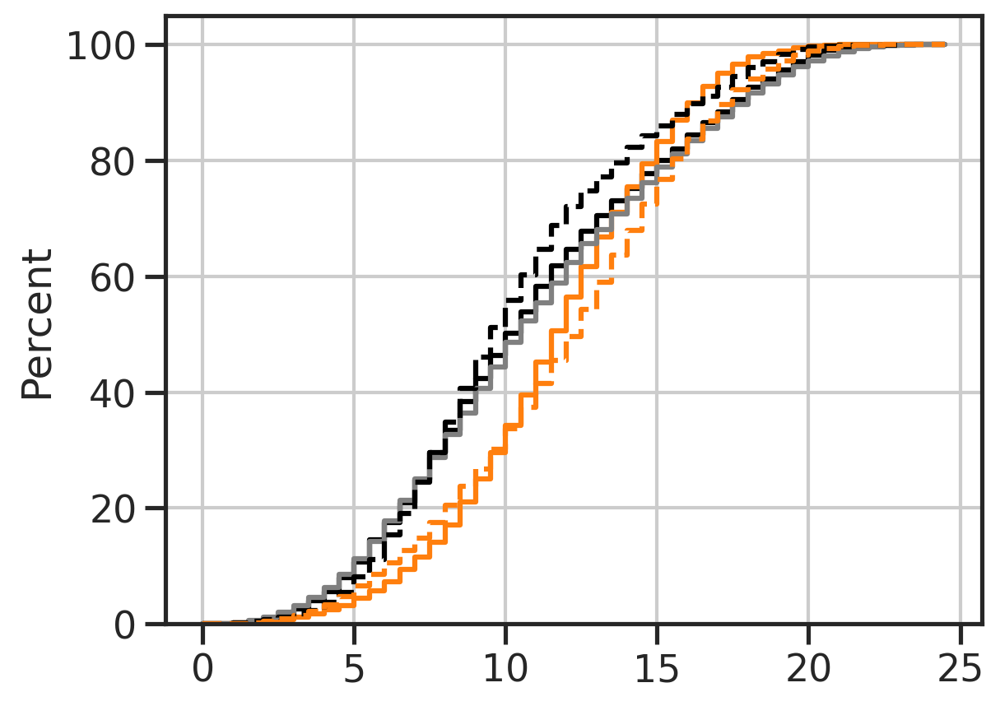

In [56]:
bins = np.arange(0,25,0.5) #linspace(0,30,30)

fig, ax = plt.subplots()
sns.histplot(dists_dict['P28NR'][1], ax=ax, stat='percent', element='step', cumulative=True, fill=False, color='k', bins=bins)
sns.histplot(dists_dict['P28DR'][1], ax=ax, stat='percent', element='step', cumulative=True, fill=False, color='C1', bins=bins)
sns.histplot(dists_dict['P28DL'][1], ax=ax, stat='percent', element='step', cumulative=True, fill=False, color='gray', bins=bins)

sns.histplot(dists_dict['P38NR'][1], ax=ax, stat='percent', element='step', cumulative=True, fill=False, color='k', linestyle='--', bins=bins)
sns.histplot(dists_dict['P38DR'][1], ax=ax, stat='percent', element='step', cumulative=True, fill=False, color='C1', linestyle='--', bins=bins)
output = os.path.join(outfigdir, 'cumdist_b.pdf')
powerplots.savefig_autodate(fig, output)

saved the figure to: /u/home/f/f7xiesnm/project-zipursky/v1-bb/ms_reanalysis/cumdist_c_2023-10-12.pdf


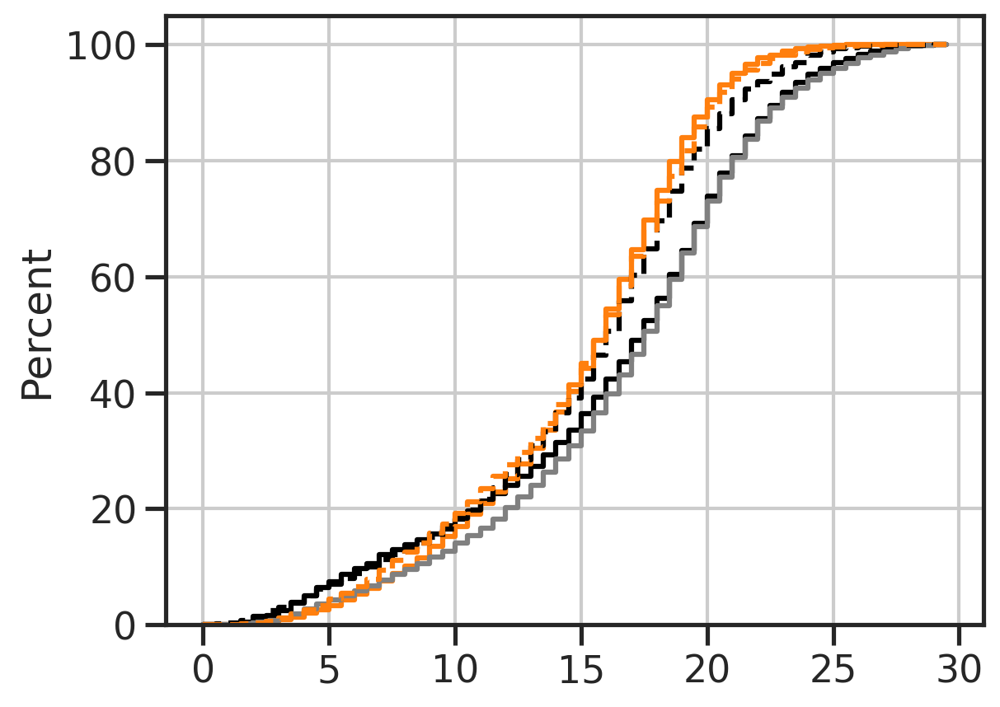

In [57]:

bins = np.arange(0,30,0.5) #linspace(0,30,30)

fig, ax = plt.subplots()
sns.histplot(dists_dict['P28NR'][2], ax=ax, stat='percent', element='step', cumulative=True, fill=False, color='k', bins=bins)
sns.histplot(dists_dict['P28DR'][2], ax=ax, stat='percent', element='step', cumulative=True, fill=False, color='C1', bins=bins)
sns.histplot(dists_dict['P28DL'][2], ax=ax, stat='percent', element='step', cumulative=True, fill=False, color='gray', bins=bins)

sns.histplot(dists_dict['P38NR'][2], ax=ax, stat='percent', element='step', cumulative=True, fill=False, color='k', linestyle='--', bins=bins)
sns.histplot(dists_dict['P38DR'][2], ax=ax, stat='percent', element='step', cumulative=True, fill=False, color='C1', linestyle='--', bins=bins)
output = os.path.join(outfigdir, 'cumdist_c.pdf')
powerplots.savefig_autodate(fig, output)

# redo quantification referencing all to the same archetypes

In [58]:
res_frac2 = pd.DataFrame(index=['A pole', 'B pole', 'C pole'])

for lbl in labels:
    unqs, cnts = np.unique(np.argmin(dists_dict2[lbl], axis=0), return_counts=True)
    print(unqs, cnts/cnts.sum())
    res_frac2[lbl] = cnts/cnts.sum()

[0 1 2] [0.17631058 0.59619189 0.22749753]
[0 1 2] [0.3764881  0.46109694 0.16241497]
[0 1 2] [0.18136939 0.67010088 0.14852973]
[0 1 2] [0.16685206 0.63403782 0.19911012]
[0 1 2] [0.24898354 0.55934172 0.19167473]


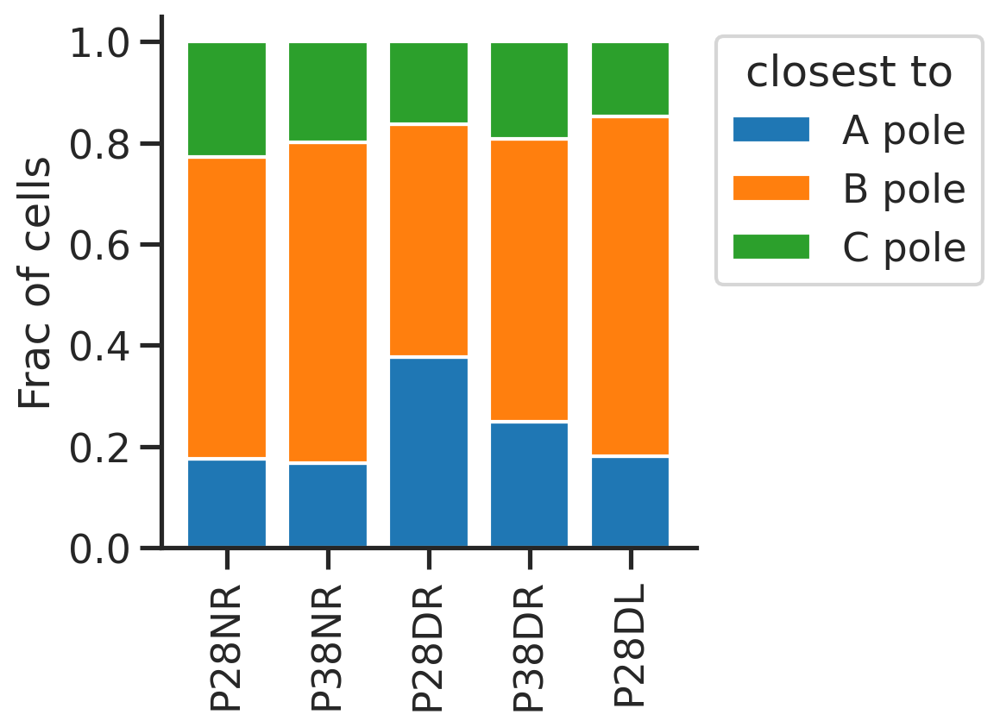

In [59]:
fig, ax = plt.subplots(figsize=(4,4))
res_frac2[['P28NR', 'P38NR', 'P28DR', 'P38DR', 'P28DL']].T.plot.bar(
    ax=ax, stacked=True, width=0.8,  
)
ax.legend(bbox_to_anchor=(1,1), title='closest to')
sns.despine(ax=ax)
ax.set_ylabel('Frac of cells')
ax.grid(False)
plt.show()

<Axes: ylabel='Percent'>

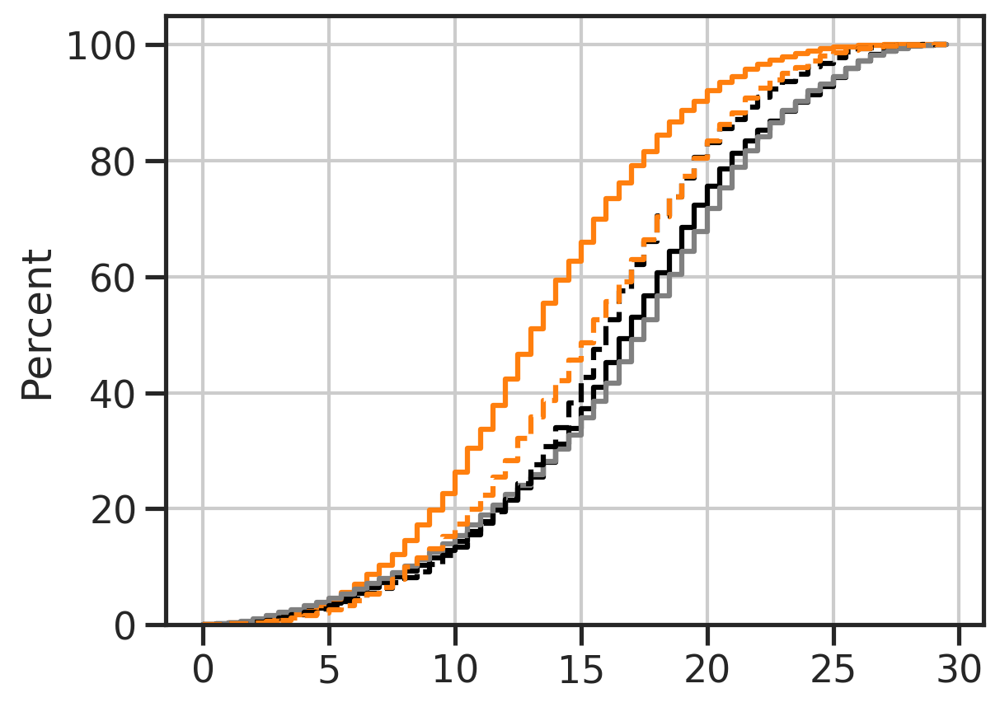

In [60]:
bins = np.arange(0,30,0.5) #linspace(0,30,30)

sns.histplot(dists_dict2['P28NR'][0], stat='percent', element='step', cumulative=True, fill=False, color='k', bins=bins)
sns.histplot(dists_dict2['P28DR'][0], stat='percent', element='step', cumulative=True, fill=False, color='C1', bins=bins)
sns.histplot(dists_dict2['P28DL'][0], stat='percent', element='step', cumulative=True, fill=False, color='gray', bins=bins)

sns.histplot(dists_dict2['P38NR'][0], stat='percent', element='step', cumulative=True, fill=False, color='k', linestyle='--', bins=bins)
sns.histplot(dists_dict2['P38DR'][0], stat='percent', element='step', cumulative=True, fill=False, color='C1', linestyle='--', bins=bins)

<Axes: ylabel='Percent'>

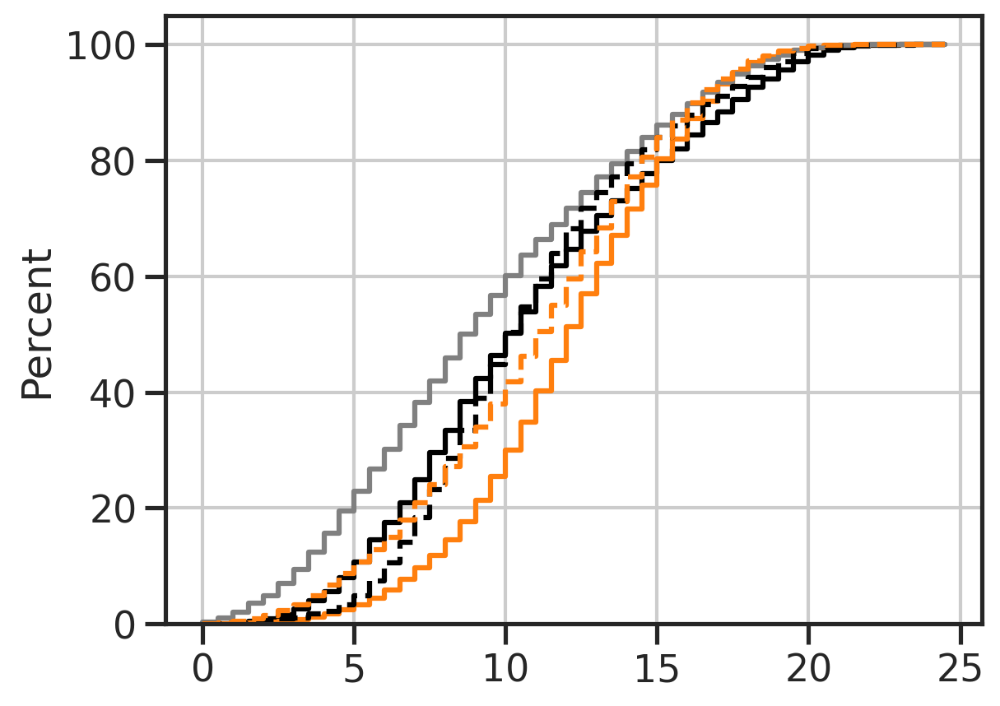

In [61]:
bins = np.arange(0,25,0.5) #linspace(0,30,30)

sns.histplot(dists_dict2['P28NR'][1], stat='percent', element='step', cumulative=True, fill=False, color='k', bins=bins)
sns.histplot(dists_dict2['P28DR'][1], stat='percent', element='step', cumulative=True, fill=False, color='C1', bins=bins)
sns.histplot(dists_dict2['P28DL'][1], stat='percent', element='step', cumulative=True, fill=False, color='gray', bins=bins)

sns.histplot(dists_dict2['P38NR'][1], stat='percent', element='step', cumulative=True, fill=False, color='k', linestyle='--', bins=bins)
sns.histplot(dists_dict2['P38DR'][1], stat='percent', element='step', cumulative=True, fill=False, color='C1', linestyle='--', bins=bins)

<Axes: ylabel='Percent'>

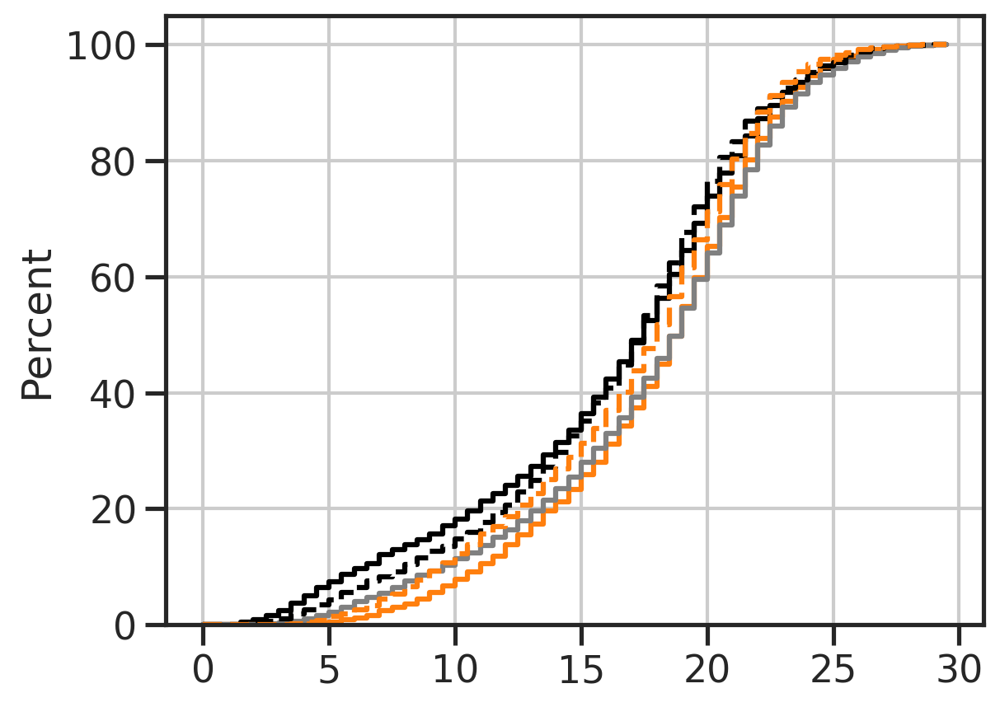

In [62]:

bins = np.arange(0,30,0.5) #linspace(0,30,30)

sns.histplot(dists_dict2['P28NR'][2], stat='percent', element='step', cumulative=True, fill=False, color='k', bins=bins)
sns.histplot(dists_dict2['P28DR'][2], stat='percent', element='step', cumulative=True, fill=False, color='C1', bins=bins)
sns.histplot(dists_dict2['P28DL'][2], stat='percent', element='step', cumulative=True, fill=False, color='gray', bins=bins)

sns.histplot(dists_dict2['P38NR'][2], stat='percent', element='step', cumulative=True, fill=False, color='k', linestyle='--', bins=bins)
sns.histplot(dists_dict2['P38DR'][2], stat='percent', element='step', cumulative=True, fill=False, color='C1', linestyle='--', bins=bins)